In [1]:
import imageio
import matplotlib.pyplot as plt

#### Load a image from the dataset and display

In [2]:
img = imageio.imread(r"D:\SML Project\mscoco\train\train2014\train2014\COCO_train2014_000000000030.jpg")

C:\Users\vigne\AppData\Local\Temp\ipykernel_9224\3911274796.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(r"D:\SML Project\mscoco\train\train2014\train2014\COCO_train2014_000000000030.jpg")


In [7]:
img

array([[[ 27,  32,  28],
        [ 28,  34,  30],
        [ 27,  36,  31],
        ...,
        [ 66,  93,  52],
        [ 66,  95,  51],
        [ 67,  96,  50]],

       [[ 28,  33,  29],
        [ 27,  33,  29],
        [ 26,  35,  30],
        ...,
        [ 66,  93,  52],
        [ 66,  95,  51],
        [ 67,  96,  50]],

       [[ 28,  33,  29],
        [ 27,  33,  29],
        [ 27,  33,  29],
        ...,
        [ 66,  93,  50],
        [ 65,  94,  50],
        [ 66,  95,  49]],

       ...,

       [[177, 179, 178],
        [176, 178, 177],
        [176, 178, 177],
        ...,
        [182, 187, 190],
        [182, 187, 190],
        [181, 186, 189]],

       [[177, 179, 178],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [182, 187, 190],
        [181, 186, 189],
        [181, 186, 189]],

       [[176, 178, 177],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [182, 187, 190],
        [181, 186, 189],
        [181, 186, 189]]

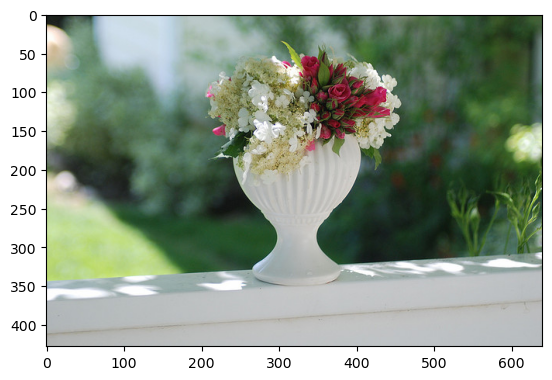

In [9]:
plt.imshow(img)
plt.show()

#### Text files generated by pre-processing

In [25]:
import json

# Open the JSON file
with open(r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\top1000_answer_vocab.json", 'r') as file:
    # Load the JSON data
    top1000_answer_vocab = json.load(file)

with open(r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\top1000_answer_vocab_dict.json", 'r') as file:
    # Load the JSON data
    top1000_answer_vocab_dict = json.load(file)

with open(r"C:\Users\vigne\Desktop\Higher studies\Northeastern University Boston\Courses\Semester 1\SML\Project\all_answers_dict.json", 'r') as file:
    # Load the JSON data
    answers = json.load(file)

print(len(top1000_answer_vocab))
print(len(top1000_answer_vocab_dict))
print(len(answers))

1000
1000
82783


#### Pre-processing of the original Answer JSON files to match with the images and create custom answer json files for top 1000 class and 2000 class training

In [23]:
import json
from collections import Counter

def get_answers(annot_path):
    with open(annot_path, 'r') as f:
        data = json.load(f)   

    answers = data['annotations']
    answers_keys = dict()
    answers_list = list()
    answers_vocab_list = []
    answer_vocab_count = []
    for i,ans in enumerate(answers):
        key = str(ans['image_id'])
        ans_list = [a['answer'] for a in ans['answers']]
        for a in ans_list:
            answer_vocab_count.append(a)
        unique_ans_list = set(ans_list)
        for one_answer in unique_ans_list:
            if one_answer not in answers_vocab_list:
                answers_vocab_list.append(one_answer)
        counter = Counter(ans_list)
        most_frequent, count = counter.most_common(1)[0]
        if key in answers_keys:
            answers_keys[key].append(most_frequent) 
        else:
            answers_keys[key] = []
            answers_keys[key].append(most_frequent)
    return answers_keys, answers_vocab_list, answer_vocab_count
answers, answers_vocab_list, answer_vocab_count = get_answers(r"D:\SML Project\mscoco\train\Annotations_Train_mscoco\mscoco_train2014_annotations.json")
final_answer_vocab = list(set(answers_vocab_list))
answer_vocab_dict = {word:i for i,word in enumerate(final_answer_vocab)}
index_to_answer = {i:w for w,i in answer_vocab_dict.items()}
answers['270070']

['warm', 'yes', 'yes']

In [29]:
dict_answer_vocab_count = Counter(answer_vocab_count)
sorted_answer_vocab_count = dict(sorted(dict_answer_vocab_count.items(), key=lambda item: item[1], reverse=True))

#### Generate a vocabulary dictionary to map the answers with corresponding labels to feed to the model

In [58]:
top1000_answer_vocab = list(sorted_answer_vocab_count.keys())[:1000]

In [31]:
top2000_answer_vocab = list(sorted_answer_vocab_count.keys())[:2000]
top2000_answer_vocab

['yes',
 'no',
 '2',
 '1',
 'white',
 '3',
 'red',
 'blue',
 '4',
 'green',
 'black',
 'yellow',
 'brown',
 '5',
 'tennis',
 'baseball',
 '6',
 'orange',
 '0',
 'bathroom',
 'wood',
 'right',
 'left',
 'frisbee',
 'pink',
 'gray',
 'pizza',
 '7',
 'kitchen',
 '8',
 'cat',
 'skiing',
 'skateboarding',
 'dog',
 'snow',
 'black and white',
 'skateboard',
 'surfing',
 'water',
 'giraffe',
 'grass',
 'surfboard',
 'wii',
 'kite',
 '10',
 'purple',
 'elephant',
 'broccoli',
 'man',
 'winter',
 'stop',
 'train',
 '9',
 'apple',
 'silver',
 'horse',
 'banana',
 'umbrella',
 'eating',
 'sheep',
 'bear',
 'phone',
 '12',
 'motorcycle',
 'cake',
 'wine',
 'beach',
 'soccer',
 'sunny',
 'zebra',
 'tan',
 'brick',
 'female',
 'bananas',
 'table',
 'laptop',
 'hat',
 'bench',
 'flowers',
 'woman',
 'male',
 'cow',
 'food',
 'living room',
 'bus',
 'snowboarding',
 'kites',
 'cell phone',
 'helmet',
 'maybe',
 'outside',
 'hot dog',
 'night',
 'trees',
 '11',
 'bird',
 'down',
 'bed',
 'camera',
 'tr

In [60]:
top1000_answer_vocab_dict = {word:i for i,word in enumerate(top1000_answer_vocab)}
top_1000_index_to_answer = {i:w for w,i in answer_vocab_dict.items()}

In [33]:
top2000_answer_vocab_dict = {word:i for i,word in enumerate(top2000_answer_vocab)}
top_2000_index_to_answer = {i:w for w,i in answer_vocab_dict.items()}

In [ ]:
import json
from collections import Counter

def get_answers(annot_path):
    with open(annot_path, 'r') as f:
        data = json.load(f)   

    answers = data['annotations']
    answers_keys = dict()
    answers_list = list()
    answers_vocab_list = []
    for i,ans in enumerate(answers):
        key = str(ans['image_id'])
        ans_list = [a['answer'] for a in ans['answers']]
        counter = Counter(ans_list)
        most_frequent, count = counter.most_common(1)[0]
        if key in answers_keys:
            answers_keys[key].append(most_frequent) 
        else:
            answers_keys[key] = []
            answers_keys[key].append(most_frequent)
    return answers_keys
answers = get_answers(r"D:\SML Project\mscoco\train\Annotations_Train_mscoco\mscoco_train2014_annotations.json")


answers['270070']

### Extract Image IDs for the images that appear in the top1000 and top2000 class answers. This list is used later in the custom dataloader

In [29]:
# Generate image ID list and answers dictionary for those images included in top 1000 classes
top1000_answers_dict = {}
top1000_image_id_list = []
target_list = top1000_answer_vocab
test_list = ['warm', 'yes', 'yes']
for key in answers:
    test_list = answers[key]
    target_counts = Counter(target_list)
    res = all(target_counts[elem] >= 1 for elem in test_list)
    if res:
        top1000_answers_dict[key] = answers[key]
        s = 'COCO_train2014_'
        top1000_image_id_list.append(s + '0'*(12-len(key)) + key + '.jpg')

In [41]:
# Generate image ID list and answers dictionary for those images included in top 2000 classes
top2000_answers_dict = {}
top2000_image_id_list = []
target_list = top2000_answer_vocab
test_list = ['warm', 'yes', 'yes']
for key in answers:
    test_list = answers[key]
    target_counts = Counter(target_list)
    res = all(target_counts[elem] >= 1 for elem in test_list)
    if res:
        top2000_answers_dict[key] = answers[key]
        s = 'COCO_train2014_'
        top2000_image_id_list.append(s + '0'*(12-len(key)) + key + '.jpg')

In [19]:
answer_vocab_dict = {word:i for i,word in enumerate(final_answer_vocab)}
index_to_answer = {i:w for w,i in answer_vocab_dict.items()}

In [31]:
answers['270070']

['warm', 'yes', 'yes']

In [43]:
def get_questions(questions_path):
    with open(questions_path,'r') as f:
        questions_json = json.load(f)
    questions = questions_json['questions']
    questions_keys = dict()
    for qns in questions:
        key = str(qns['image_id'])
        if key in questions_keys:
            questions_keys[key].append(qns) 
        else:
            questions_keys[key] = []
            questions_keys[key].append(qns)
    return questions_keys
questions = get_questions(r"D:\SML Project\mscoco\train\Questions_Train_mscoco\OpenEnded_mscoco_train2014_questions.json")
questions['270070']

[{'question': 'Is this location in a cold climate or a warm climate?',
  'image_id': 270070,
  'question_id': 2700700},
 {'question': 'Can you walk through this?',
  'image_id': 270070,
  'question_id': 2700701},
 {'question': 'Is there anywhere to sit down?',
  'image_id': 270070,
  'question_id': 2700702}]

#### Create Custom dataloader to load images and questions in batches for the top 1000 and 2000 answers in the dataset

In [25]:
#create a custom dataloader for all answers
import torch
from torch.utils.data import Dataset
import os
from PIL import Image
import json

class CustomDataset(Dataset):
    def __init__(self, root_dir,answers, questions,answers_vocab_dict, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, img) for img in os.listdir(top1000_image_id_list)]
        self.answers = answers
        self.questions = questions
        self.answers_vocab_dict = answers_vocab_dict
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        image_name =os.path.basename(img_path).split('/')[-1]
        image_name = image_name.split('.')[0]
        image_id = image_name.split('_')[-1].lstrip('0')
        if self.transform:
            image = self.transform(image)
        answers = self.answers[image_id]
        answers_label = [self.answers_vocab_dict[key] for key in answers]
        return image, answers_label, self.questions[image_id]

In [35]:
#Custom data loader for top1000 answers
import torch
from torch.utils.data import Dataset
import os
from PIL import Image
import json

class CustomDataset(Dataset):
    def __init__(self, root_dir,top1000_answers_dict, questions,top1000_answer_vocab_dict, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, img) for img in top1000_image_id_list]
        self.top1000_answers_dict = top1000_answers_dict
        self.questions = questions
        self.top1000_answer_vocab_dict = top1000_answer_vocab_dict
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        image_name =os.path.basename(img_path).split('/')[-1]
        image_name = image_name.split('.')[0]
        image_id = image_name.split('_')[-1].lstrip('0')
        if self.transform:
            image = self.transform(image)
        answers = self.top1000_answers_dict[image_id]
        answers_label = [self.top1000_answer_vocab_dict[key] for key in answers]
        return image, answers_label, self.questions[image_id]

In [45]:
#Custom data loader for top2000 answers
import torch
from torch.utils.data import Dataset
import os
from PIL import Image
import json

class CustomDataset(Dataset):
    def __init__(self, root_dir,top2000_answers_dict, questions,top2000_answer_vocab_dict, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, img) for img in top2000_image_id_list]
        self.top2000_answers_dict = top2000_answers_dict
        self.questions = questions
        self.top2000_answer_vocab_dict = top2000_answer_vocab_dict
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        image_name =os.path.basename(img_path).split('/')[-1]
        image_name = image_name.split('.')[0]
        image_id = image_name.split('_')[-1].lstrip('0')
        if self.transform:
            image = self.transform(image)
        answers = self.top2000_answers_dict[image_id]
        answers_label = [self.top2000_answer_vocab_dict[key] for key in answers]
        return image, answers_label, self.questions[image_id]

In [47]:
#creating a dataloader
from torch.utils.data import DataLoader
from torchvision import transforms

transform = transforms.Compose([
    # you can add other transformations in this list
    transforms.ToTensor(),
     transforms.Resize((224, 224)),
    
])

In [29]:
dataset = CustomDataset(root_dir=r"D:\SML Project\mscoco\train\train2014\train2014",answers=answers,questions=questions,answers_vocab_dict=answer_vocab_dict, transform=transform)
dataloader = DataLoader(dataset, batch_size=5, shuffle=True)

In [39]:
#Dataloader for top1000 answers
dataset = CustomDataset(root_dir=r"D:\SML Project\mscoco\train\train2014\train2014",top1000_answers_dict=top1000_answers_dict,questions=questions,top1000_answer_vocab_dict=top1000_answer_vocab_dict, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

In [51]:
#Dataloader for top2000 answers
dataset = CustomDataset(root_dir=r"D:\SML Project\mscoco\train\train2014\train2014",top2000_answers_dict=top2000_answers_dict,questions=questions,top2000_answer_vocab_dict=top2000_answer_vocab_dict, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

#### Loading a batch to check if the images along with the corresponding answer labels and questions are being loaded

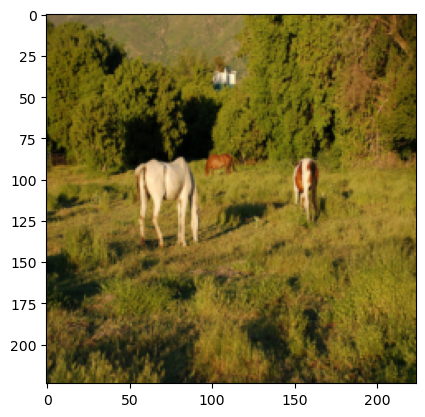

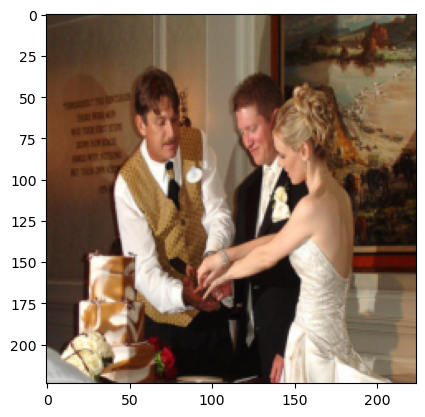

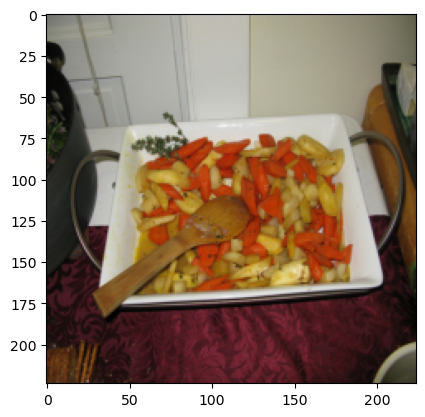

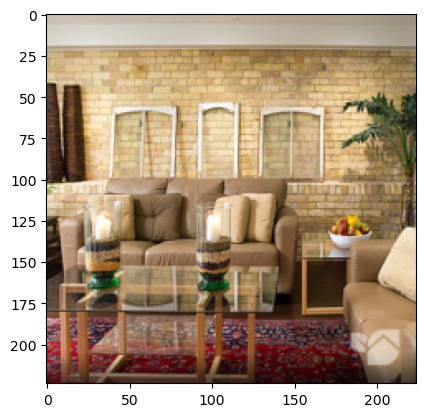

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


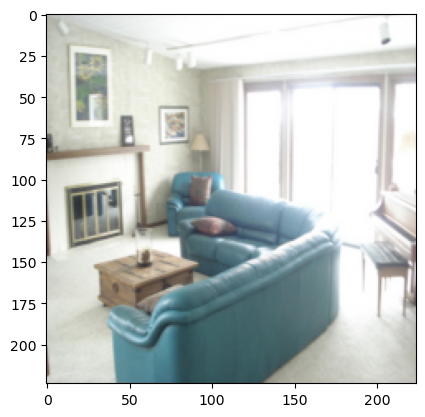

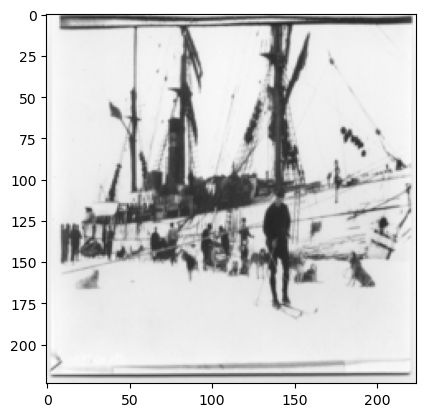

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


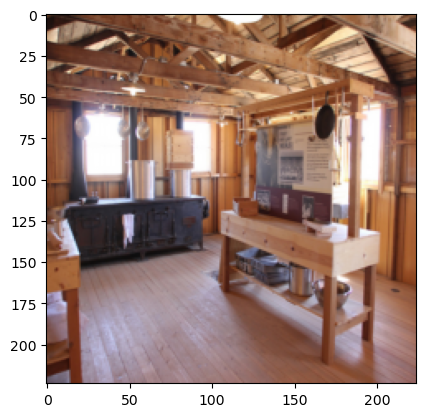

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


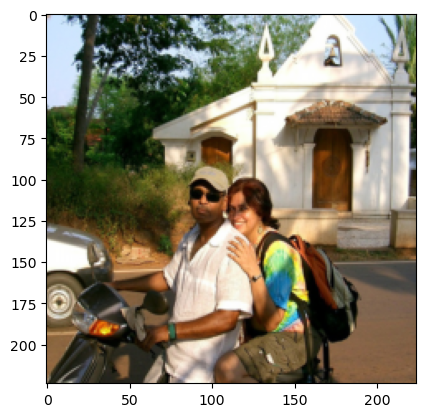

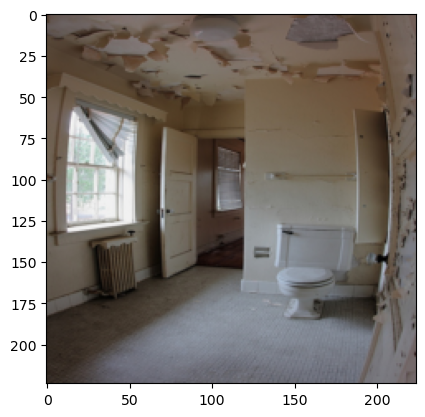

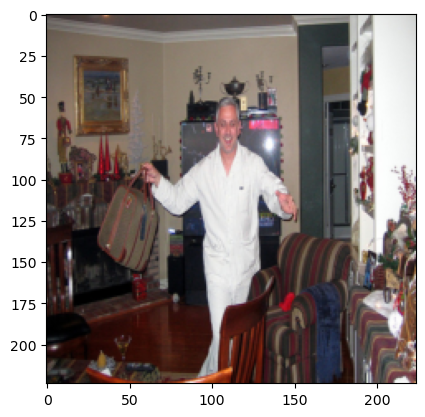

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


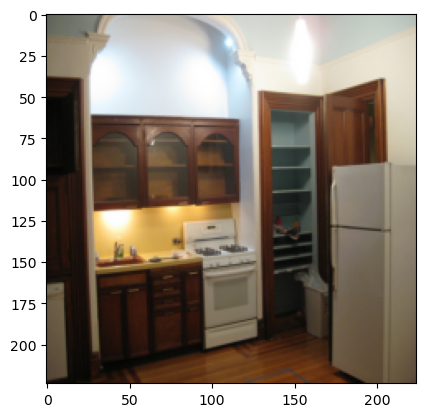

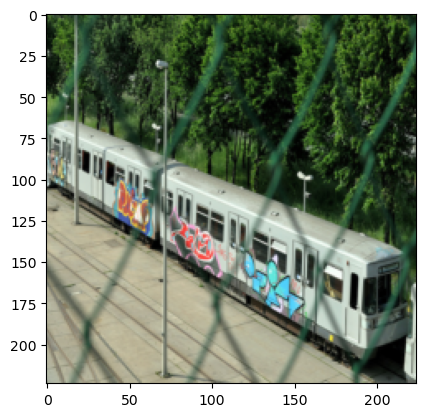

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


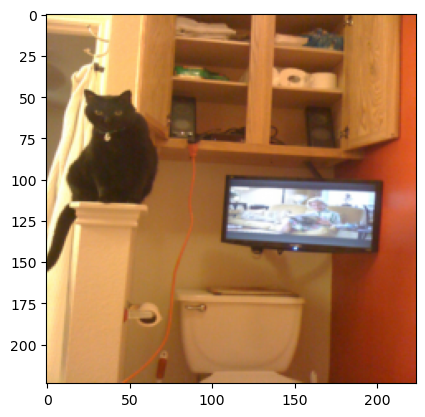

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


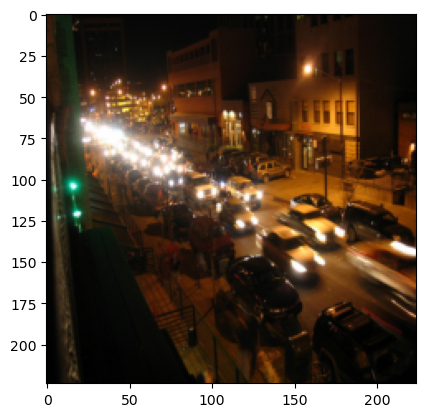

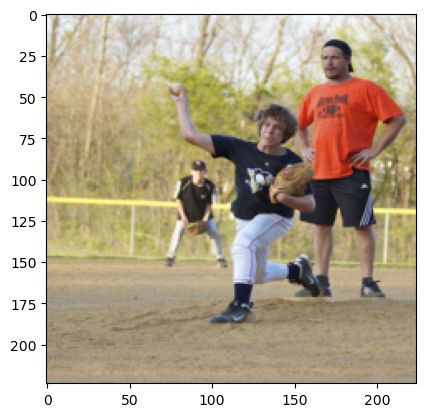

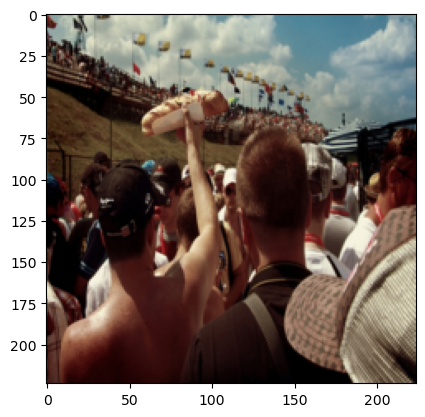

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


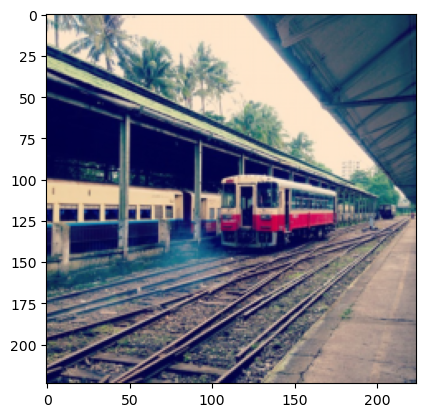

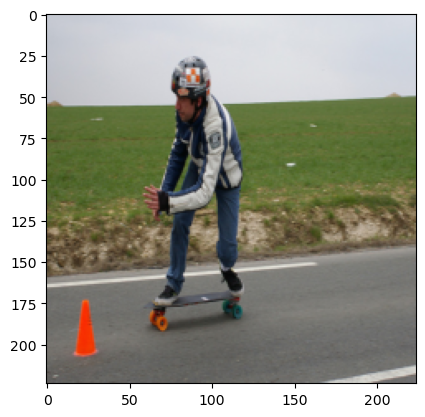

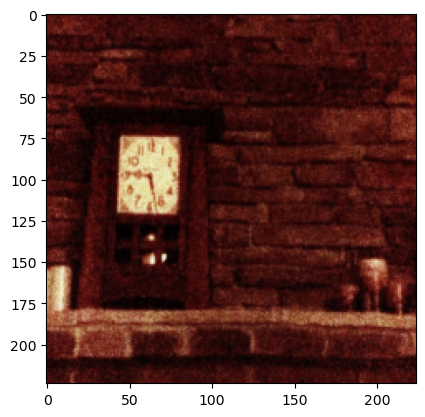

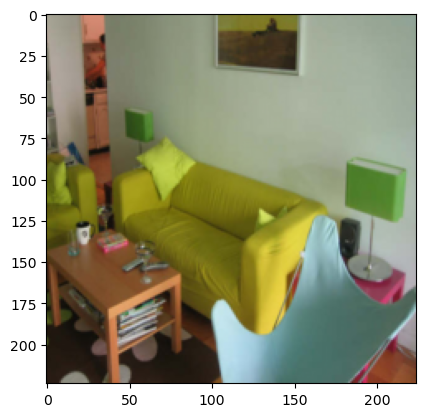

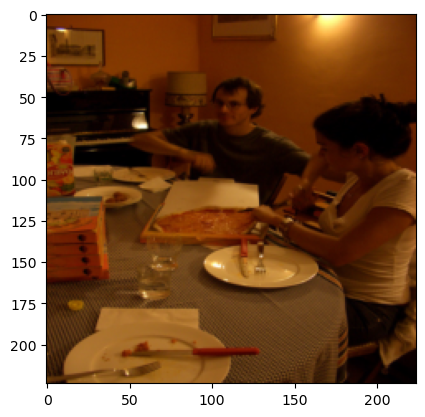

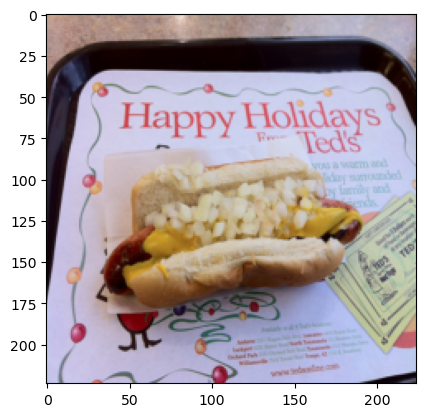

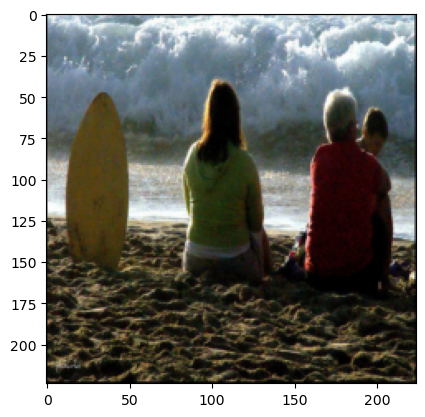

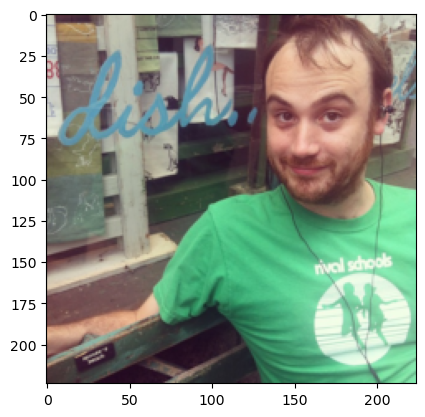

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


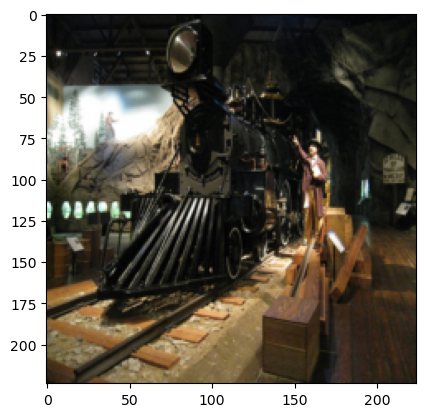

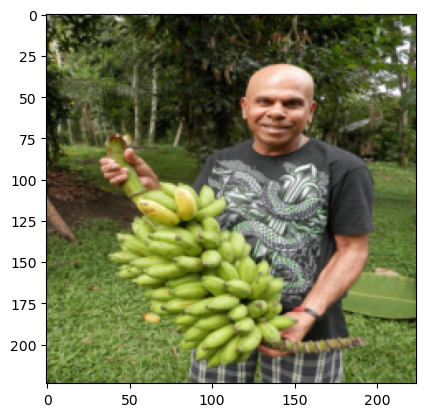

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


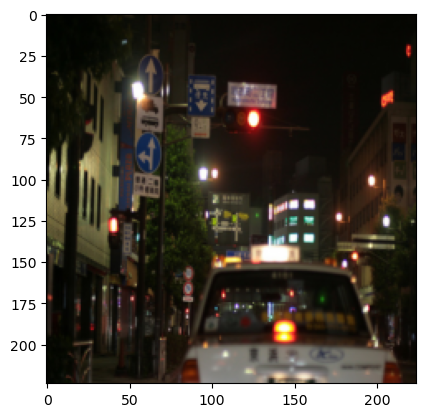

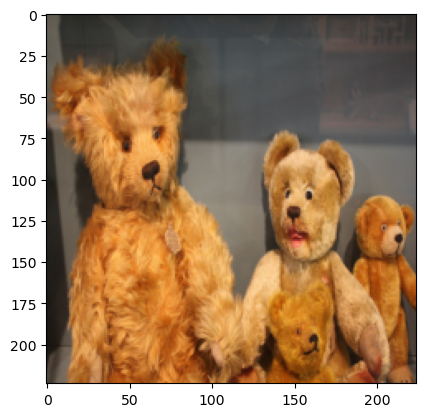

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


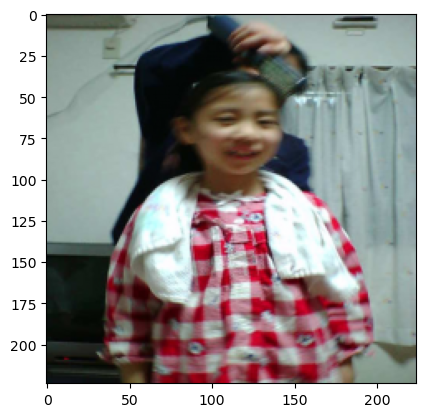

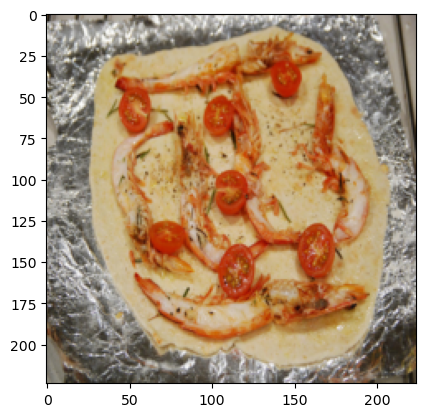

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


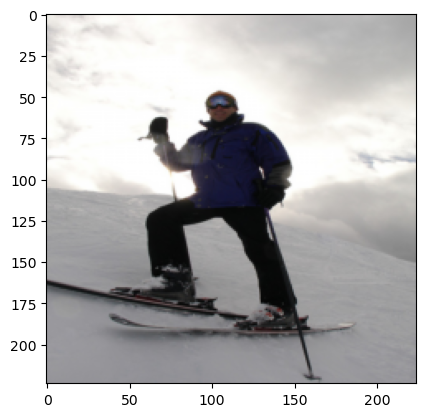

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


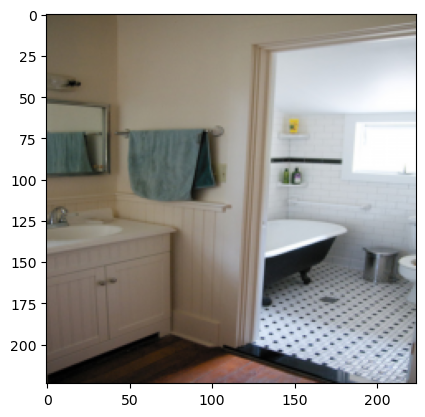





torch.Size([32, 3, 224, 224])
tensor([   1,  171,    0,  168,  309,    1,  203,  291,    1,  100,    4,    0,
          19,    1,   21,    2,    8,    0,  197,   83,   26,    0,   41,    1,
           1,    1,    4,    8,  773, 1764,  141, 1221])




['Are these animals in a farm?', 'What kind of cake is in the photo?', 'Is this a cooked meal?', 'What is in the white bowl on the table?', 'What fabric are the couches made from?', 'Is this a cruise ship?', 'What sort of equipment is shown?', 'What type of building are they at?', 'Is the window blind closed?', 'What holiday is the room decorated for?', 'What color is the refrigerator?', 'Are the trees green?', 'Which room is this?', 'Is it day time?', 'Which hand is throwing the ball?', 'How many people took their shirt off?', 'How many sets of track are there?', 'Is this an experienced skateboarder?', 'What is on the mantle?', 'What room is this?', 'What type of food is inside the boxes?', "Does Ted's have gift certificates?", 'What 

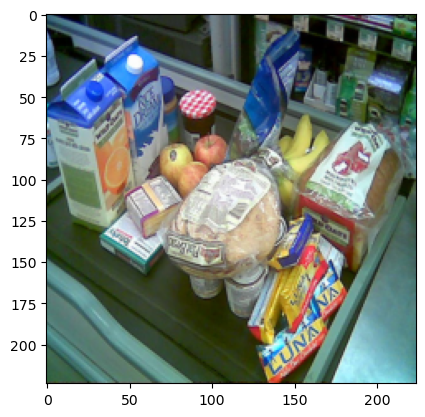

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


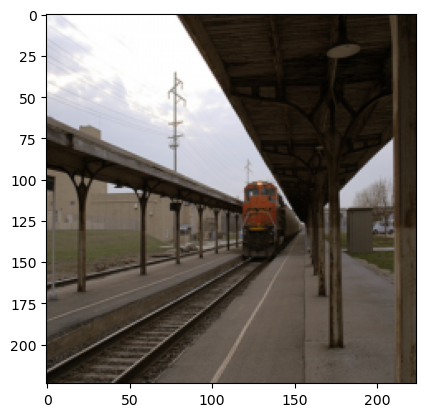

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


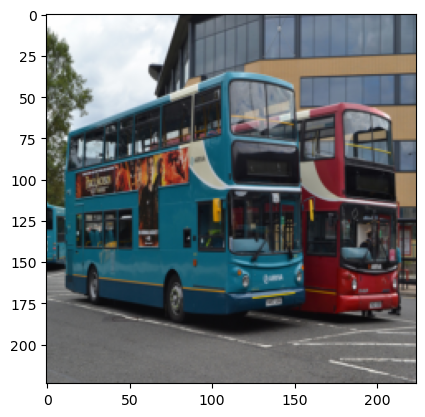

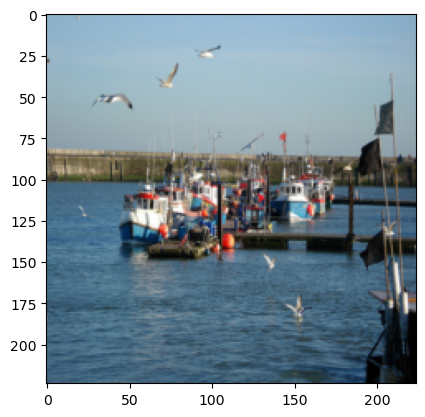

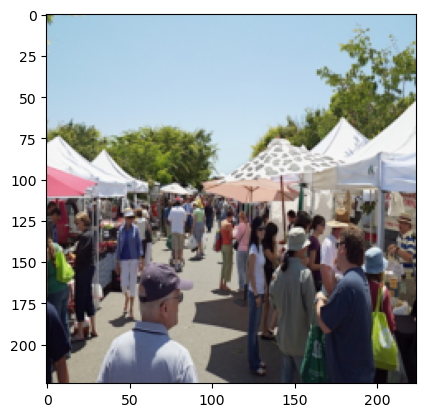

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


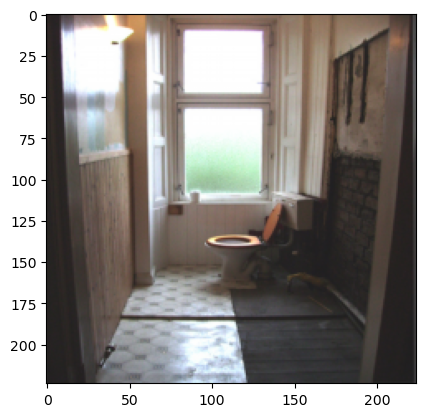

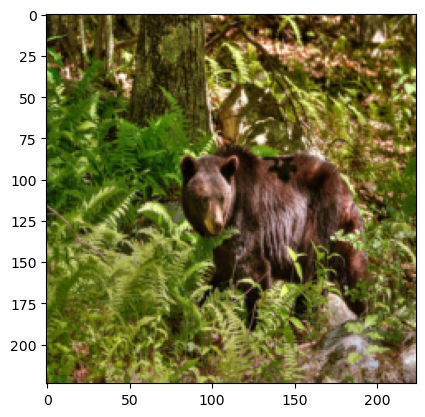

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


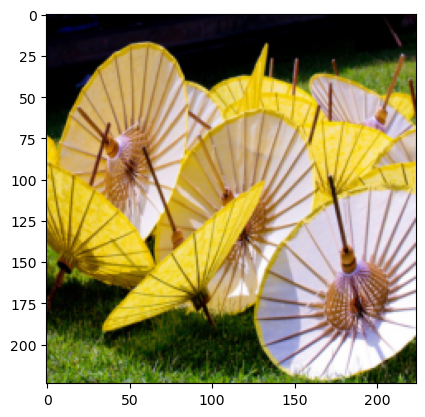

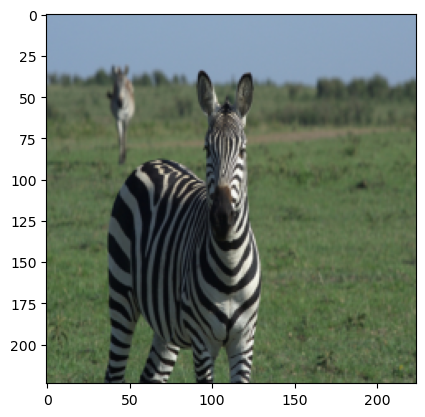

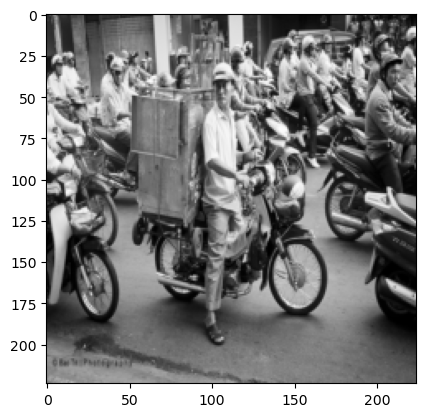

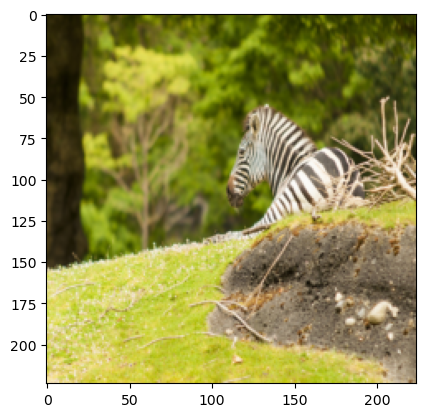

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


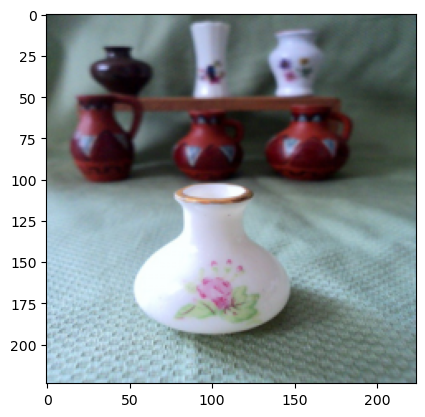

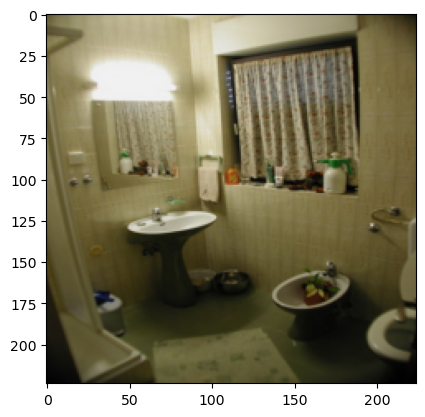

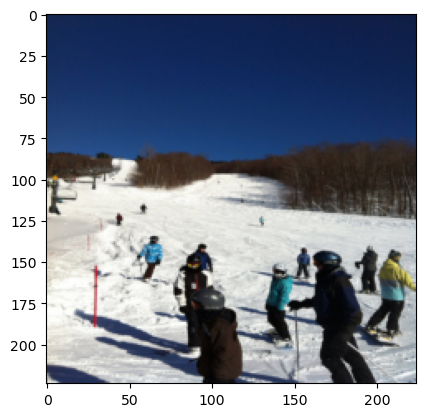

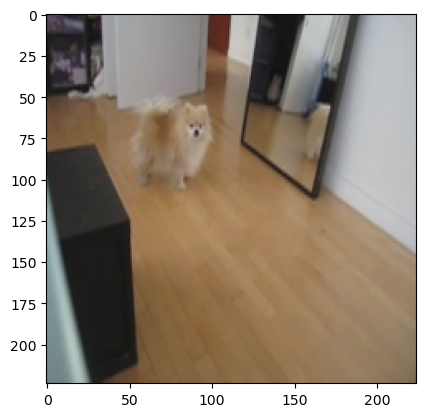

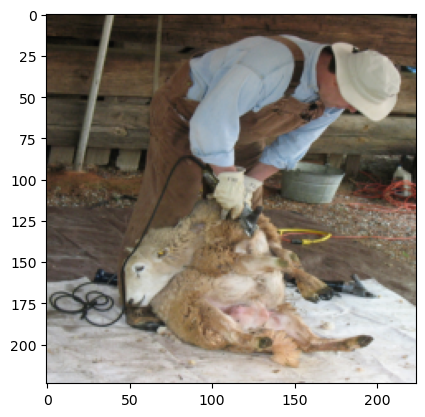

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


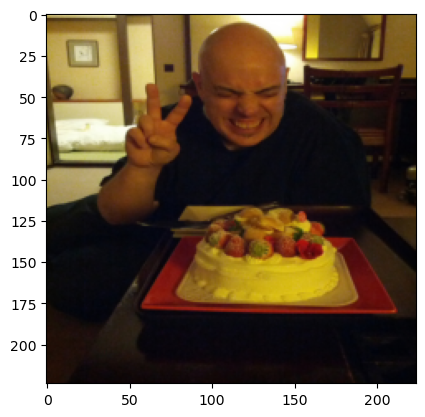

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


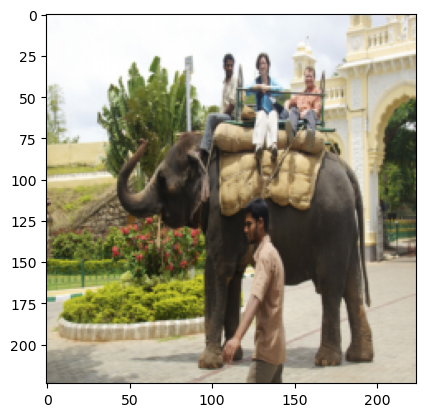

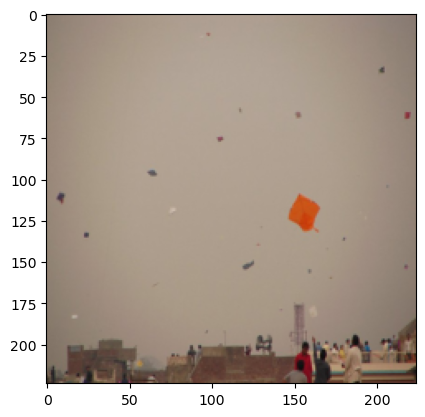

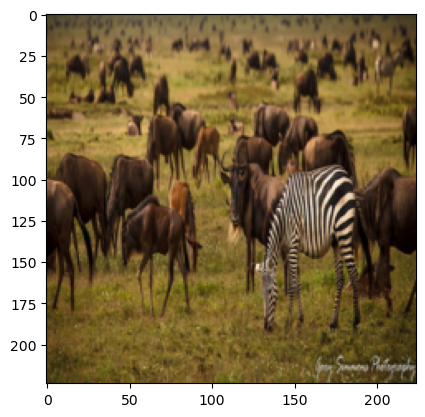

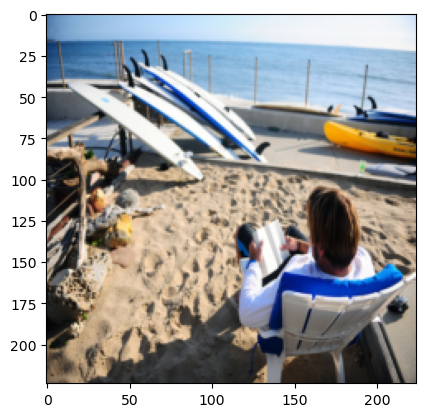

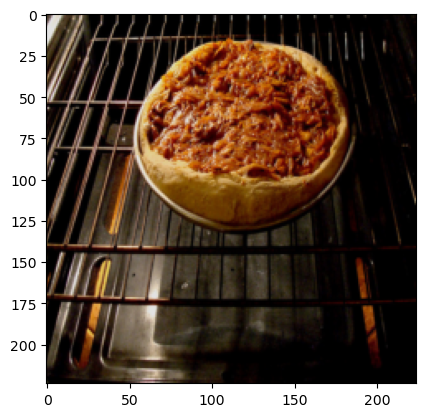

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


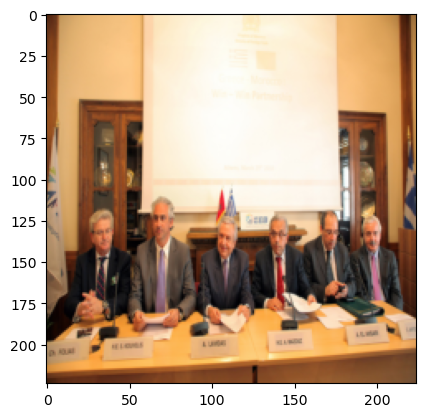

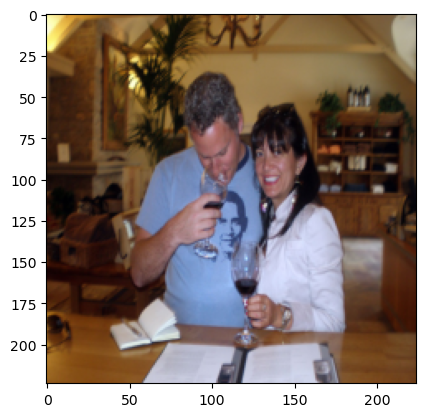

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


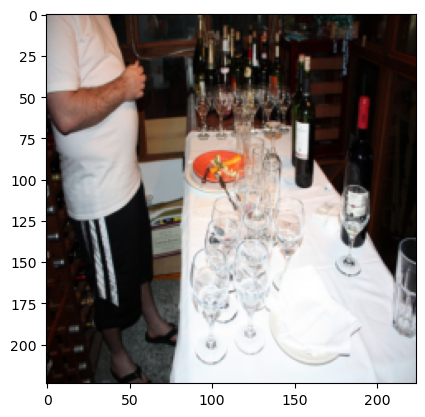

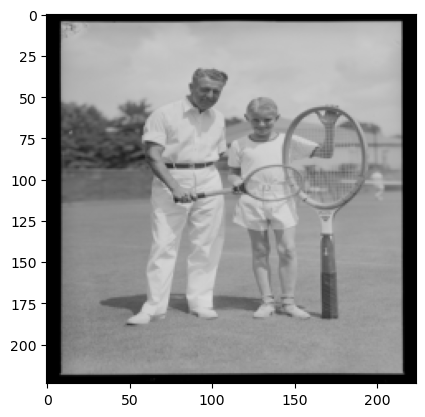

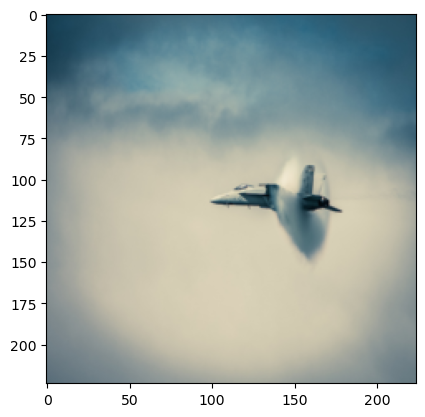

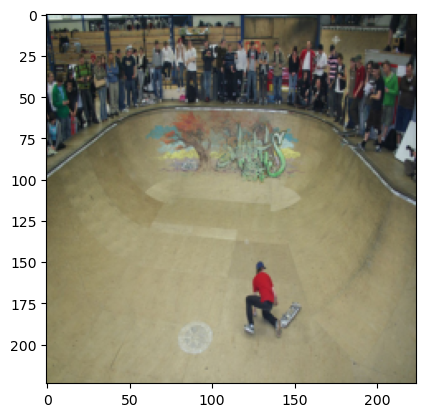

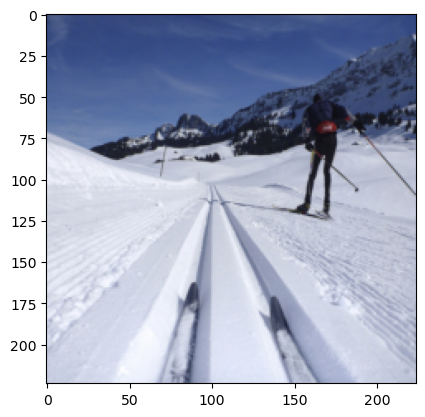

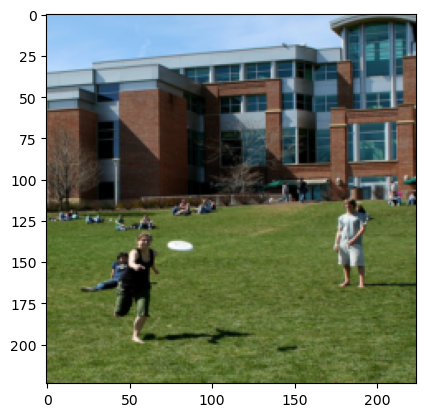

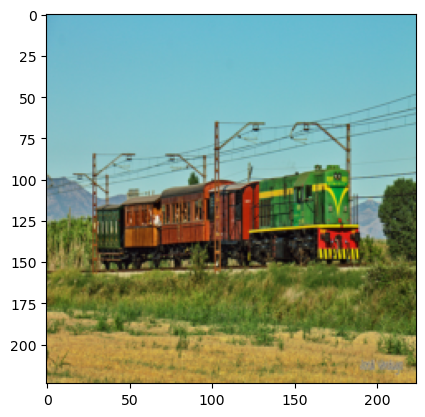

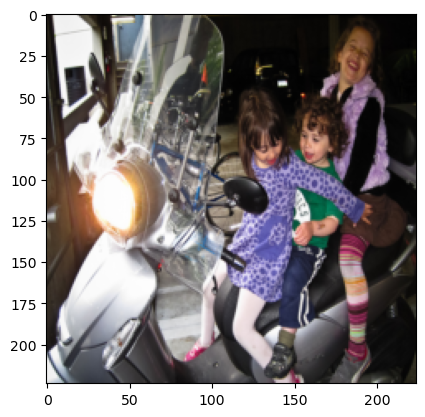





torch.Size([32, 3, 224, 224])
tensor([   5,    4,    1,    0, 1950,  109,    0,    0,    0,    0,    0,    5,
           3,    2,   33,    4,   64,   46,    1,    0,    7,    2,    3,   74,
           1,    4,    0,  639,    0,    1,    8,   45])




['How many apples are there?', 'What color vehicle is parked in the background on the right?', 'Are these buses the same color?', 'Are there any birds?', 'What general activity are these peoples engaged in doing?', 'What type of flooring is shown?', 'Is this a type of animal people are afraid of?', 'Are these items all the same?', 'Is there a trail here?', 'Do most motorcycles have one rider?', 'Is the zebra resting?', 'How many items are red?', 'How many non-duplicate curtains are there?', 'How many ski slopes are there?', 'What kind of animal is this?', 'What color is the  hat?', 'What is in front of the man?', 'What animal is pictured?', 'Are those airplanes in the sky?', 'Is there an animal that seems to stick out?', 'What color ar

In [53]:
for data in range(2):
    batch, answers_batch, questions = next(iter(dataloader))
    show = torch.permute(batch,(0,2,3,1))
    for num in range(32):
        plt.imshow(show[num,:,:,:])
        plt.show()
    print("\n\n\n")
    print(batch.shape)
    print(answers_batch[0])
    print("\n\n\n")
    print(questions[0]['question'])